In [1]:
import scvelo as scv
import numpy as np  
import matplotlib.pyplot as plt

import anndata

import sys
sys.path.append("..")


import cellpath as cp
import cellpath.visual as visual
import cellpath.benchmark as bmk 
import cellpath.de_analy as de


from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.kernel_ridge import KernelRidge

import statsmodels.api as sm

# CellPath core

In [2]:
# pre-clustered dataseet
adata = anndata.read_h5ad("../real_data/dg/dg_clust2.h5ad")

In [3]:
adata.var.index = [str(x)[2:-1] for x in adata.var.index.values]
adata.obs.index = [str(x)[2:-1] for x in adata.obs.index.values]
adata.obs["clusters"] = [str(x)[2:-1] for x in adata.obs["clusters"].values]
adata.obs["age(days)"] = [str(x)[2:-1] for x in adata.obs["age(days)"].values]
adata.obs["clusters_enlarged"] = [str(x)[2:-1] for x in adata.obs["clusters_enlarged"].values]

In [4]:
cellpath_obj = cp.CellPath(adata = adata)
# self, n_clusters = None, include_unspliced = True, standardize = True, **kwarg
cellpath_obj.meta_cell_construction(flavor = "k-means", n_clusters = 300, include_unspliced = True, standardize = True)
cellpath_obj.meta_cell_graph(k_neighs = 10, pruning = True)
cellpath_obj.meta_paths_finding(threshold = 0.5, cutoff_length = None, length_bias = 0.5, max_trajs = 30)
cellpath_obj.first_order_pt(num_trajs = None)

Already conducted clustering
Meta-cell constructed, number of meta-cells: 300
Meta-cell level neighborhood graph constructed
conduct quality control
selected path (starting_ending):
start_end:  258_256 , len:  11 newly covered: 11
start_end:  128_277 , len:  9 newly covered: 9
start_end:  254_134 , len:  8 newly covered: 8
start_end:  258_109 , len:  8 newly covered: 7
start_end:  21_159 , len:  7 newly covered: 6
start_end:  219_118 , len:  7 newly covered: 6
start_end:  92_272 , len:  6 newly covered: 6
start_end:  183_203 , len:  7 newly covered: 5
start_end:  137_294 , len:  7 newly covered: 4
start_end:  250_150 , len:  5 newly covered: 5
start_end:  90_209 , len:  8 newly covered: 3
start_end:  8_48 , len:  4 newly covered: 4
start_end:  21_23 , len:  6 newly covered: 3
start_end:  22_261 , len:  4 newly covered: 4
start_end:  65_195 , len:  4 newly covered: 4
start_end:  94_40 , len:  4 newly covered: 4
start_end:  167_205 , len:  4 newly covered: 4
start_end:  190_215 , len:  6

# Visualization

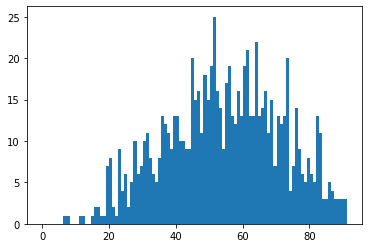

In [5]:
visual.weight_histogram(cellpath_obj, resolution = 100)

In [6]:
def plot_data(cellpath_obj, basis = "umap", figsize = (15,7), save_as = None, title = None, **kwargs):
    """\
    Description
        Plot original dataset
    
    Parameters
    ----------
    cellpath_obj
        cellpath object
    basis
        the basis used for visualization
    figsize
        Figure size, tuple
    save_as
        Name of the saved file
    """

    _kwargs = {
        "axis": False,
        "legend_pos": "upper left",
        "colormap": "tab20",
        "s": 10,
        "add_arrow": False
    }
    _kwargs.update(kwargs)

    X = cellpath_obj.adata.obsm["X_" + basis]
    fig = plt.figure(figsize = figsize)
    ax = fig.add_subplot()
    if _kwargs["axis"]:
        ax.tick_params(axis = "both", direction = "out", labelsize = 16)
        ax.set_xlabel(basis + " 1", fontsize = 19)
        ax.set_ylabel(basis + " 2", fontsize = 19)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
    else:
        ax.axis("off")

    if "age(days)" in cellpath_obj.adata.obs.columns:
        cluster_anno = [x for x in cellpath_obj.adata.obs["age(days)"].values]
        cluster_uni = [x for x in np.unique(cellpath_obj.adata.obs["age(days)"].values)]

        colormap = plt.cm.get_cmap(_kwargs["colormap"], len(cluster_uni))

        for count, clust in enumerate(cluster_uni):
            idx = np.where(np.array(cluster_anno) == clust)[0]
            ax.scatter(X[idx,0], X[idx,1], color = colormap(count), alpha = 0.7, label = clust, s = _kwargs["s"])    
        ax.legend(loc=_kwargs["legend_pos"], prop={'size': 15}, frameon = False, ncol = 1)
    
    elif "sim_time" in cellpath_obj.adata.obs.columns:
        X_ordered = X[np.argsort(cellpath_obj.adata.obs["sim_time"].values),:]
        if _kwargs["add_arrow"]:
            for i in range(X_ordered.shape[0]-1):
                line = ax.plot(X_ordered[i:(i+2), 0], X_ordered[i:(i+2), 1], 'gray', '-', alpha = 1)
                add_arrow(line[0], size = 5)

        pic = ax.scatter(X_ordered[:,0], X_ordered[:,1], cmap = "gnuplot", c = np.arange(X_ordered.shape[0]), alpha = 1, s = _kwargs["s"])
        cbar = fig.colorbar(pic, fraction=0.046, pad=0.04, ax = ax)
        cbar.ax.tick_params(labelsize = 20)
        

    else:
        ax.scatter(X[:,0], X[:,1], color = "red", alpha = 0.7, s = _kwargs["s"])

    if title is not None:
        ax.set_title(title, fontsize = 25)
    if save_as != None:
        fig.savefig(save_as, bbox_inches = 'tight')


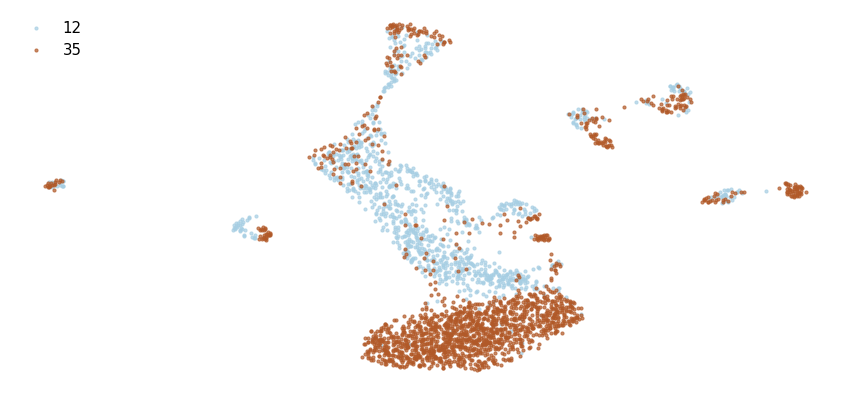

In [48]:
plot_data(cellpath_obj, basis = "umap", figsize = (15,7), save_as = None, axis = False, colormap = "Paired")

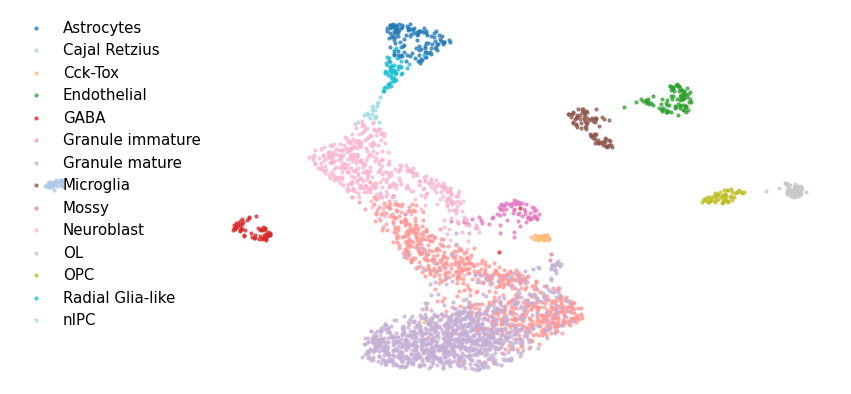

In [5]:
visual.plot_data(cellpath_obj, basis = "umap", figsize = (15,7), save_as = None, axis = False)

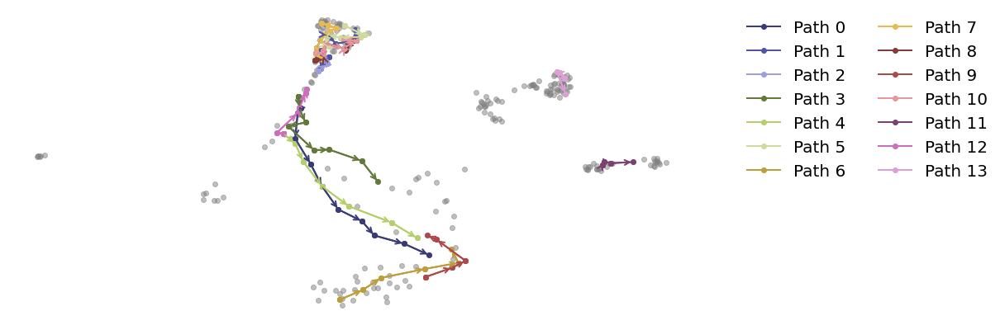

In [7]:
visual.meta_traj_visual(cellpath_obj, basis = "umap", trajs = 14, figsize = (15,7), save_as= None, axis = False, cmap = "tab20b", arrow_size = 15, linewidth = 2, legend_pos = "upper left")

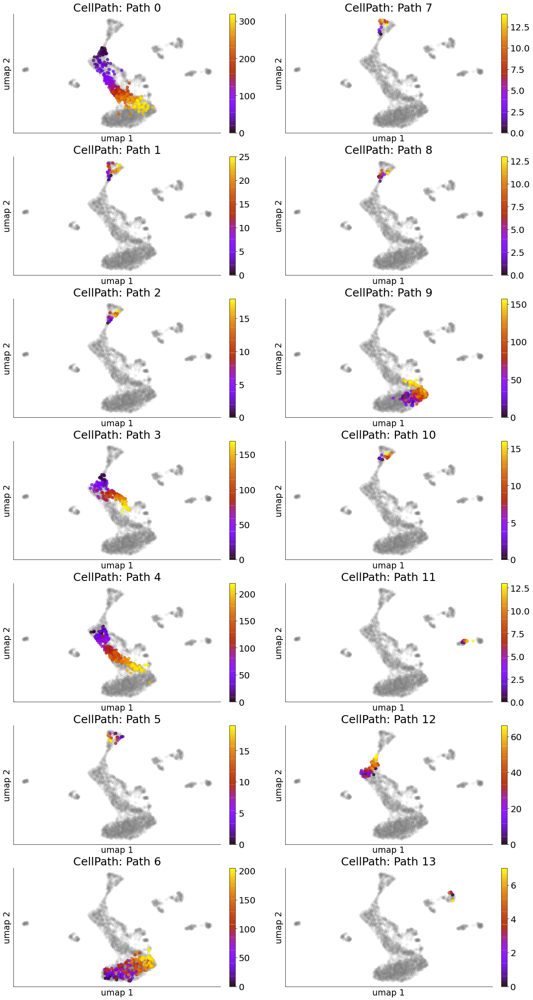

In [8]:
visual.first_order_approx_pt(cellpath_obj, basis = "umap", trajs = 14, figsize = (20,40), save_as = None)

# Differentially expressed genes

In [9]:
import importlib 
importlib.reload(de)

<module 'cellpath.de_analy' from '../cellpath/de_analy.py'>

In [15]:
de_genes = de.de_analy(cellpath_obj, p_val_t = 0.05, verbose = False, distri = "neg-binomial", fdr_correct = True)

Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attrib

In [59]:
def plot_data(cellpath_obj, basis = "umap", gene = "Adcy1", figsize = (15,7), save_as = None, **kwargs):
    _kwargs = {
        "axis": False,
        "legend_pos": "upper left",
        "colormap": "tab20",
        "s": 10,
        "add_arrow": False
    }
    _kwargs.update(kwargs)

    X = cellpath_obj.adata.obsm["X_" + basis]
    fig = plt.figure(figsize = figsize)
    ax = fig.add_subplot()
    if _kwargs["axis"]:
        ax.tick_params(axis = "both", direction = "out", labelsize = 16)
        ax.set_xlabel(basis + " 1", fontsize = 19)
        ax.set_ylabel(basis + " 2", fontsize = 19)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
    else:
        ax.axis("off")
        

    pic = ax.scatter(X[:,0], X[:,1], c = np.log1p(cellpath_obj.adata[:,gene].layers["spliced"].toarray()), alpha = 0.7, s = _kwargs["s"])
    cbar = fig.colorbar(pic, fraction=0.046, pad=0.04, ax = ax)
    cbar.ax.tick_params(labelsize = 20)

    ax.set_title(gene, fontsize = 25)
    if save_as != None:
        fig.savefig(save_as, bbox_inches = 'tight')


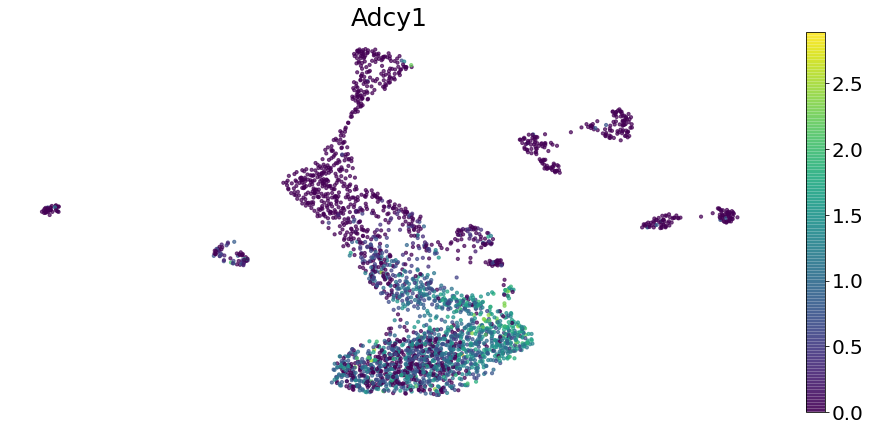

In [60]:
plot_data(cellpath_obj, gene = "Adcy1", save_as = "Adcy1.pdf")

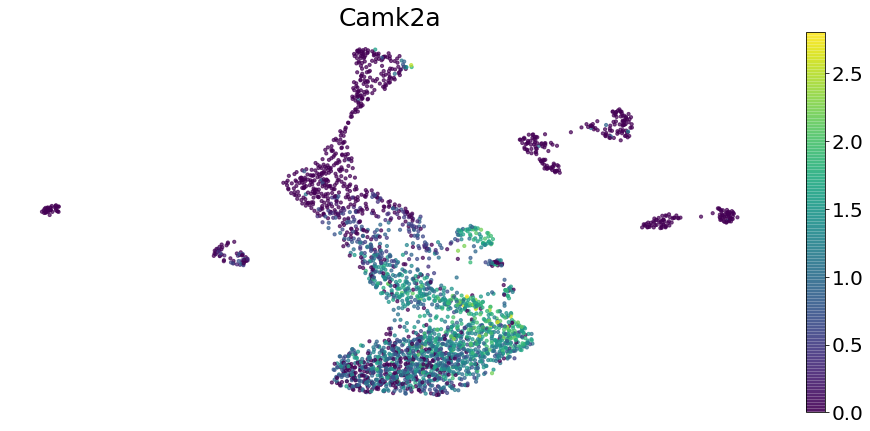

In [61]:
plot_data(cellpath_obj, gene = "Camk2a", save_as = "Camk2a.pdf")

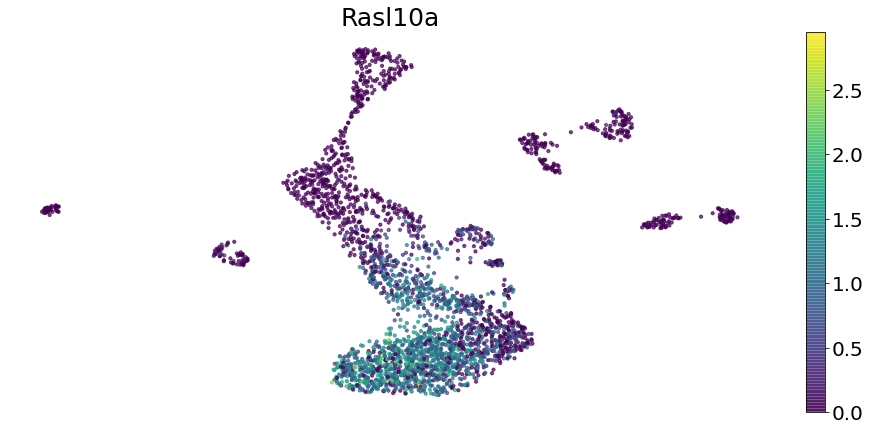

In [62]:
plot_data(cellpath_obj, gene = "Rasl10a", save_as = "Rasl10a.pdf")

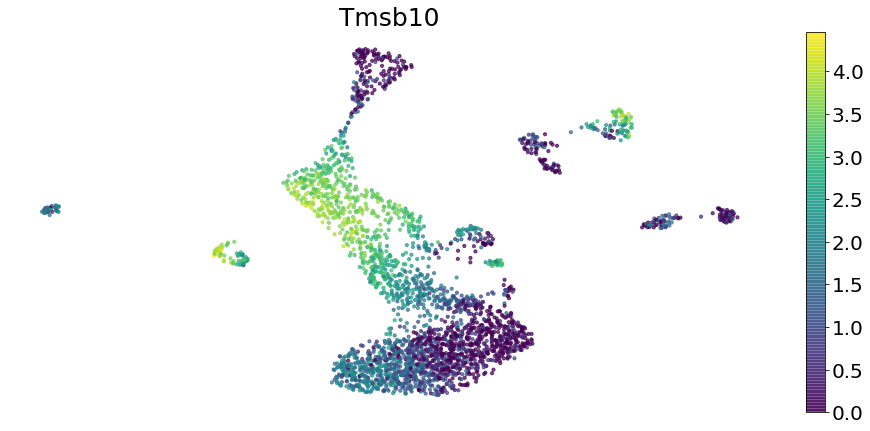

In [63]:
plot_data(cellpath_obj, gene = "Tmsb10", save_as = "Tmsb10.pdf")

In [49]:
pseudo_order = cellpath_obj.pseudo_order
for reconst_i in de_genes.keys():
    # get de gene
    de_gene = [x["gene"] for x in de_genes[reconst_i]]
    with open(reconst_i + "_de.txt", "w") as fp:
        for gene in de_gene:
            fp.write(gene + "\n")

    # get background gene
    sorted_pt = pseudo_order[reconst_i].dropna(axis = 0).sort_values()
    ordering = sorted_pt.index.values.squeeze()

    # spliced stores the count before log transform, but after library size normalization. 
    adata_sub = cellpath_obj.adata[ordering,:]
    background = [x for x in adata_sub.var.index.values]
    # add in de genes
    background = list(set(background).union(set(de_gene)))
    with open(reconst_i + "_background.txt", "w") as fp:
        for gene in background:
            fp.write(gene + "\n")
    
    print("length of de: " + str(len(de_gene)) + ", length of background: " + str(len(background)))

length of de: 372, length of background: 974
length of de: 359, length of background: 974
length of de: 232, length of background: 974
length of de: 338, length of background: 974
length of de: 270, length of background: 974
length of de: 3, length of background: 974
length of de: 38, length of background: 974
length of de: 0, length of background: 974
length of de: 0, length of background: 974
length of de: 9, length of background: 974
length of de: 0, length of background: 974
length of de: 5, length of background: 974
length of de: 548, length of background: 974
length of de: 1, length of background: 974
length of de: 0, length of background: 974
length of de: 1, length of background: 974
length of de: 426, length of background: 974
length of de: 4, length of background: 974
length of de: 15, length of background: 974
length of de: 349, length of background: 974
length of de: 19, length of background: 974
length of de: 6, length of background: 974
length of de: 0, length of backgrou

Text(0.5, 1.0, 'Camk2a')

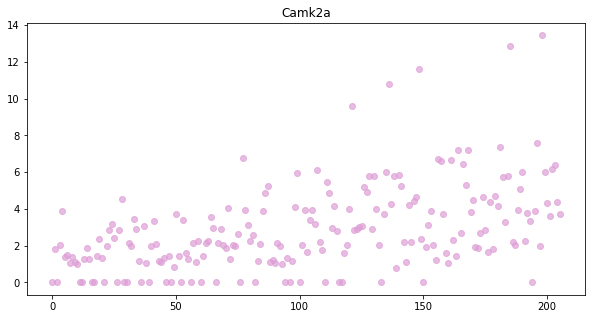

In [17]:
import os
import errno
# # turn off interactive mode for matplotlib
# plt.ioff()
n_genes = 24
figsize = (10,5)
ncols = 2
nrows = np.ceil(n_genes/2).astype('int32')

adata = cellpath_obj.adata
pseudo_order = cellpath_obj.pseudo_order

reconst_i = "traj_6"
# ordering of genes
sorted_pt = pseudo_order[reconst_i].dropna(axis = 0).sort_values()
ordering = sorted_pt.index.values.squeeze()
adata_i = adata[ordering, :]
# make plot
fig, axs = plt.subplots(nrows = 1, ncols = 1, figsize = figsize)
colormap = plt.cm.get_cmap('tab20b', n_genes)
for idx, gene in enumerate(de_genes[reconst_i][:n_genes]):
    # plot log transformed version
    if gene["gene"] == "Camk2a":
        gene_dynamic = np.squeeze(adata_i[:,gene["gene"]].layers["spliced"].toarray())

        gene_pred = gene['regression']

# reconst_i = "traj_6"
# sorted_pt = pseudo_order[reconst_i].dropna(axis = 0).sort_values()
# ordering = sorted_pt.index.values.squeeze()
# adata_i = adata[ordering, :]

# for idx, gene in enumerate(de_genes[reconst_i][:n_genes]):
#     # plot log transformed version
#     if gene["gene"] == "Camk2a":
#         gene_dynamic = np.append(gene_dynamic, np.squeeze(adata_i[:,gene["gene"]].layers["spliced"].toarray()))
#         pse_t = np.arange(gene_dynamic.shape[0])[:,np.newaxis]

#         #gene_pred = np.append(gene_pred, gene['regression'])



axs.scatter(np.arange(gene_dynamic.shape[0]), gene_dynamic, color = colormap(idx), alpha = 0.7)
# axs.plot(pse_t, gene_pred, color = "black", alpha = 1)
axs.set_title("Camk2a")

In [64]:
def de_plot(cellpath_obj, de_genes, figsize = (20,40), n_genes = 20, save_path = None):
    import os
    import errno
    # # turn off interactive mode for matplotlib
    # plt.ioff()

    ncols = 1
    nrows = np.ceil(1).astype('int32')

    adata = cellpath_obj.adata
    pseudo_order = cellpath_obj.pseudo_order

    for reconst_i in de_genes.keys():
        # ordering of genes
        sorted_pt = pseudo_order[reconst_i].dropna(axis = 0).sort_values()
        # ordering = [int(x.split("_")[1]) for x in sorted_pt.index]
        ordering = sorted_pt.index.values.squeeze()
        adata_i = adata[ordering, :]

        # create directory
        if save_path != None:
            directory = save_path + reconst_i + "/"
            if not os.path.exists(os.path.dirname(directory)):
                try:
                    os.makedirs(os.path.dirname(directory))
                except OSError as exc: # Guard against race condition
                    if exc.errno != errno.EEXIST:
                        raise
        # make plot
        fig, axs = plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize)
        colormap = plt.cm.get_cmap('tab20b', n_genes)
        count = 0
        for idx, gene in enumerate(de_genes[reconst_i][:n_genes]):
            if gene["gene"] in ['Tmsb10']:
                # plot log transformed version
                gene_dynamic = np.squeeze(adata_i[:,gene["gene"]].layers["spliced"].toarray())
                pse_t = np.arange(gene_dynamic.shape[0])[:,np.newaxis]

                gene_null = gene['null']
                gene_pred = gene['regression']
                
                axs.scatter(np.arange(gene_dynamic.shape[0]), gene_dynamic, color = colormap(idx), alpha = 0.7)
                axs.plot(pse_t, gene_pred, color = "black", alpha = 1)
                axs.plot(pse_t, gene_null, color = "red", alpha = 1)
                axs.set_title(gene['gene'], fontsize = 15)
                axs.set_xlabel("pseudotime", fontsize = 15)
                axs.set_ylabel("UMI counts", fontsize = 15)
                count += 1
        
        if save_path != None:
            fig.savefig(directory + "de.pdf", bbox_inches = 'tight')
    # store the gene_id result
    if save_path != None:
        import json
        gene_names_ordered = {}
        for reconst_i in de_genes.keys():
            gene_names_ordered[reconst_i] = [{"gene_id": gene["gene"], "p_val": gene["p_val"]} for gene in de_genes[reconst_i]]
        with open(save_path + "de_genes_ordered.json","w") as fp:
            json.dump(gene_names_ordered, fp)
   

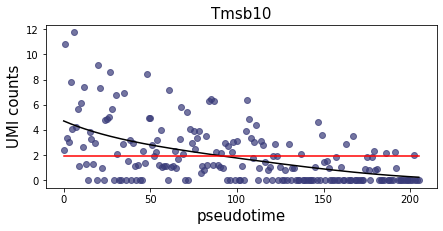

In [65]:
de_plot(cellpath_obj, {"traj_6": de_genes["traj_6"]}, figsize = (7,3), n_genes = 24, save_path = None)

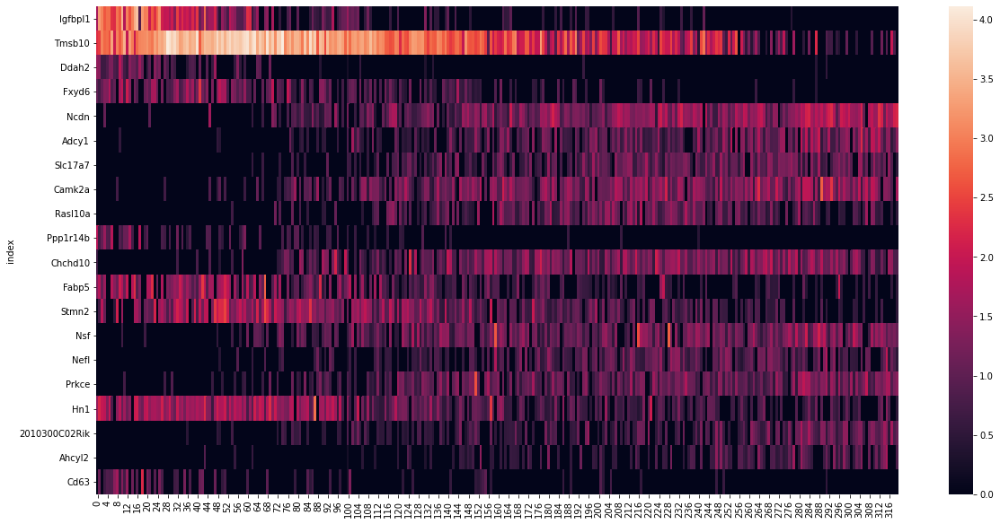

In [11]:
de.de_heatmap(cellpath_obj, {"traj_0": de_genes["traj_0"]}, figsize=(20,10), n_genes= 20, save_path = None)